Calculate the Bayes Factor for the absolute magnitude using the `pocoMC` package to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [11]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

import pocomc as pc

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [12]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [13]:
data_filename = '../../../../Data/NSA/NSA_v1_0_1_VAGC_vflag-V2-VF_updated.fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [14]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [15]:
rabsmag_NSA = np.array(catalog_main['ELPETRO_ABSMAG'][:,4])

## Separate galaxies by their LSS classifications

### $V^2$

In [6]:
wall_v2 = catalog_main['vflag_V2'] == 0
void_v2 = catalog_main['vflag_V2'] == 1
edge_v2 = catalog_main['vflag_V2'] == 2
out_v2 = catalog_main['vflag_V2'] == 9

### VoidFinder

In [16]:
wall_vf = catalog_main['vflag_VF'] == 0
void_vf = catalog_main['vflag_VF'] == 1
edge_vf = catalog_main['vflag_VF'] == 2
out_vf = catalog_main['vflag_VF'] == 9

In [17]:
del catalog_main, catalog_north, data

# Fit the $M_r$ distributions with skewnormal distributions

Both one- and two-parent models

In [18]:
#rabsmag_bins = np.linspace(-25, -12.5, 170)
rabsmag_bins = np.arange(-24, -15, 0.1)

In [19]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

This is a unimodal distribution, but we are fitting it with a sum of two skew normals to account for the extra bumps in the distributions.

## 1-parent model

In [20]:
#temp_infile = open('dynesty_output/sampler_results_model1_gauss_rabsmag_V2.pickle', 'rb')
temp_infile = open('pocoMC_results/sampler_results_M1_rabsmag_VoidFinder.pickle', 'rb')
VF_results1 = pickle.load(temp_infile)
temp_infile.close()

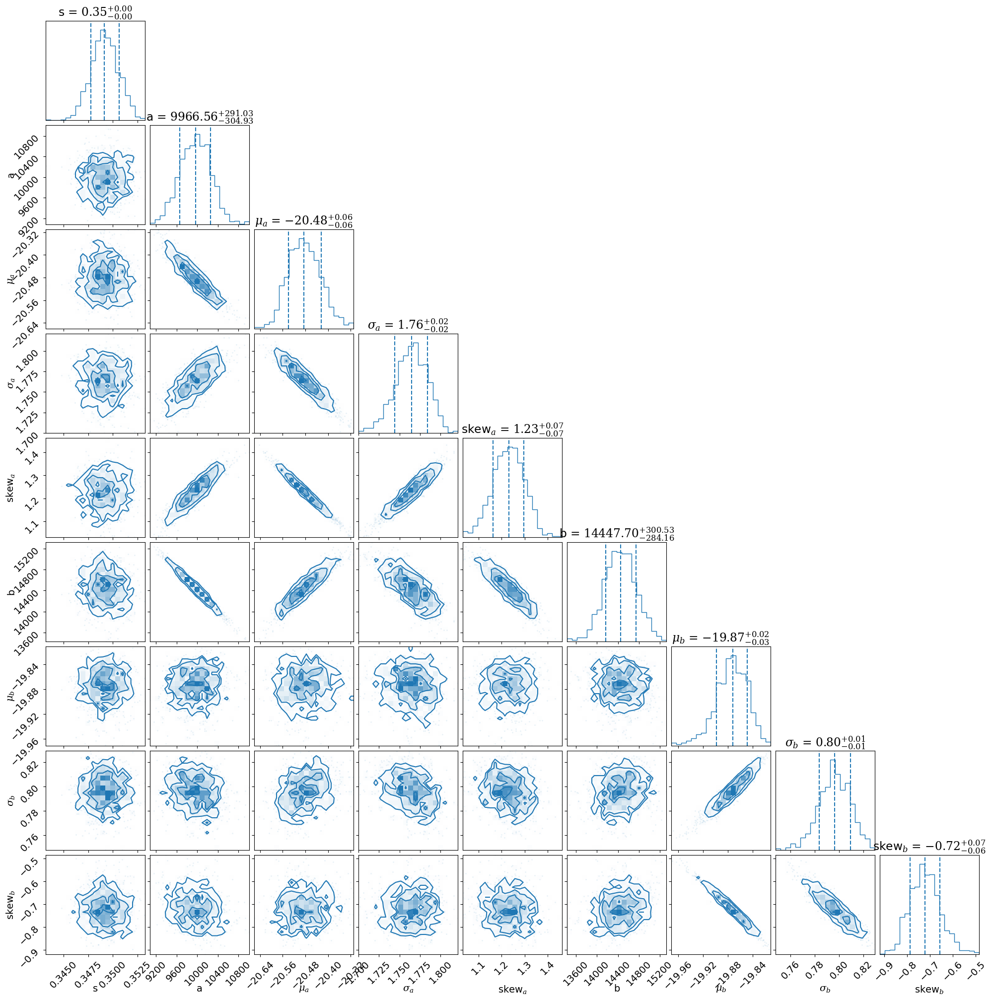

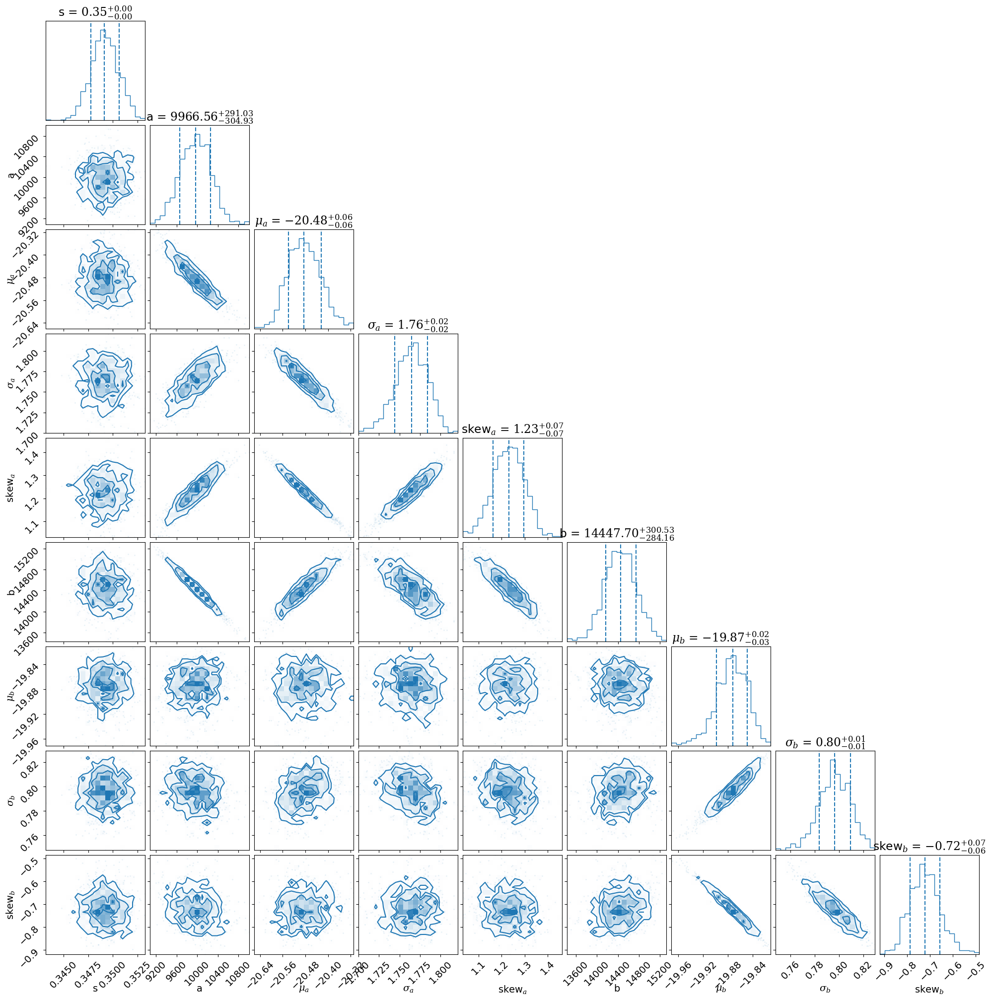

In [21]:
pc.plotting.corner(VF_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [22]:
lnzM1_VF = VF_results1['logz'][-1]
lnzM1_VF

-4018.1668195403076

In [23]:
VF_bestfit1 = np.mean(VF_results1['samples'], axis=0)

VF_bestfit1

array([ 3.4916773e-01,  9.9653994e+03, -2.0482307e+01,  1.7638901e+00,
        1.2290890e+00,  1.4447250e+04, -1.9874393e+01,  7.9624361e-01,
       -7.1981275e-01], dtype=float32)

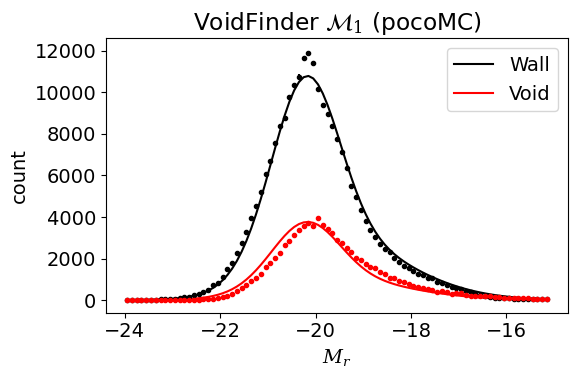

In [24]:
Model_1_plot(VF_bestfit1, 
             rabsmag_NSA[wall_vf], 
             rabsmag_NSA[void_vf], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'VoidFinder $\mathcal{M}_1$ (pocoMC)')

## 2-parent model

##### V$^2$

In [73]:
def prior_xform2_uni_V2(u):
    '''
    Priors for the 8 parameters of unimodel M2.  Required by the dynesty 
    sampler.


    PARAMETERS
    ==========

    u : ndarray
        Array of uniform random numbers between 0 and 1.


    RETURNS
    =======
    
    priors : ndarray
        Transformed random numbers giving prior ranges on model parameters.
    '''

    a = jeffreys(1000, 10000, u[0])
    mu_a = uniform(-24, -18, u[1])
    sigma_a = uniform(0.1, 5, u[2])
    skew_a = uniform(0, 5, u[3])

    b = jeffreys(10000, 50000, u[4])
    mu_b = uniform(-24, -18, u[5])
    sigma_b = uniform(0.1, 5, u[6])
    skew_b = uniform(0, 5, u[7])

    return a, mu_a, sigma_a, skew_a, b, mu_b, sigma_b, skew_b



def prior_xform2_bi_V2(u):
    '''
    Priors for the 16 parameters of bimodel M2.  Required by the dynesty 
    sampler.


    PARAMETERS
    ==========

    u : ndarray
        Array of uniform random numbers between 0 and 1.


    RETURNS
    =======
    
    priors : ndarray
        Transformed random numbers giving prior ranges on model parameters.
    '''

    a1 = jeffreys(500, 5000, u[0])
    mu_a1 = uniform(-22, -20.4, u[1])
    sigma_a1 = uniform(0.1, 5, u[2])
    skew_a1 = uniform(-5, 10, u[3])

    b1 = jeffreys(5000, 20000, u[4])
    mu_b1 = uniform(-20.4, -16, u[5])
    sigma_b1 = uniform(0.1, 5, u[6])
    skew_b1 = uniform(-5, 5, u[7])
    
    a2 = jeffreys(5000, 20000, u[8])
    mu_a2 = uniform(-22, -20, u[9])
    sigma_a2 = uniform(0.1, 5, u[10])
    skew_a2 = uniform(0, 5, u[11])

    b2 = jeffreys(5000, 20000, u[12])
    mu_b2 = uniform(-20, -16, u[13])
    sigma_b2 = uniform(0.1, 5, u[14])
    skew_b2 = uniform(-5, 5, u[15])

    return a1, mu_a1, sigma_a1, skew_a1, b1, mu_b1, sigma_b1, skew_b1, \
           a2, mu_a2, sigma_a2, skew_a2, b2, mu_b2, sigma_b2, skew_b2


In [74]:
Model_2_sampler(prior_xform2_bi_V2, 
                rabsmag_NSA[wall_v2], 
                rabsmag_NSA[void_v2], 
                rabsmag_bins, 
                2, 
                '_rabsmag_V2')

running the nested sampler... this might take from minutes to hours...


13431it [04:08, 45.64it/s, batch: 0 | bound: 177 | nc: 25 | ncall: 316378 | eff(%):  4.239 | loglstar:   -inf < -2251.109 <    inf | logz: -2282.665 +/-  0.351 | dlogz: 721.700 >  0.010]   /Users/kellydouglass/opt/anaconda3/lib/python3.8/site-packages/dynesty/sampling.py:221: UserWarning: Random number generation appears to be extremely inefficient. Adjusting the scale-factor accordingly.
  warnings.warn("Random number generation appears to be "
/Users/kellydouglass/opt/anaconda3/lib/python3.8/site-packages/dynesty/sampling.py:243: UserWarning: Random walk proposals appear to be extremely inefficient. Adjusting the scale-factor accordingly.
  warnings.warn("Random walk proposals appear to be "
13618it [04:13, 52.12it/s, batch: 0 | bound: 181 | nc: 25 | ncall: 323829 | eff(%):  4.199 | loglstar:   -inf < -2184.044 <    inf | logz: -2216.383 +/-  0.354 | dlogz: 655.115 >  0.010]  /Users/kellydouglass/opt/anaconda3/lib/python3.8/site-packages/dynesty/sampling.py:243: UserWarning: Random w

sampler output saved as pickle file 'dynesty_output/sampler_results_model2_rabsmag_V2'


In [75]:
temp_infile = open('dynesty_output/sampler_results_model2_rabsmag_V2.pickle', 'rb')
dres2_V2_rabsmag = pickle.load(temp_infile)
temp_infile.close()

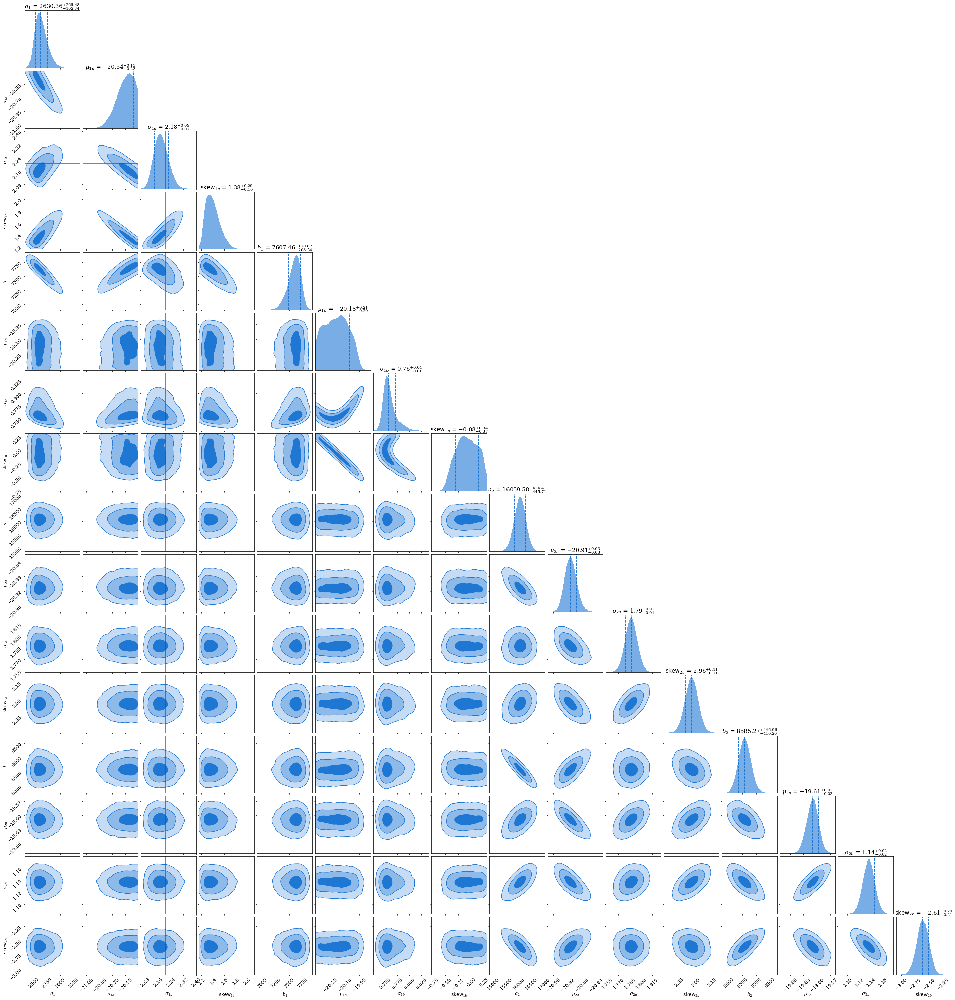

In [76]:
nparams = len(labels2_bi)

fig, axes = dyplot.cornerplot(dres2_V2_rabsmag, smooth=0.03, 
                              labels=labels2_bi, 
                              truths=V2_rabsmag_bestfit2.x, 
                              show_titles=True, 
                              quantiles_2d=[1-np.exp(-0.5*r**2) for r in [1, 2, 3]], 
                              quantiles=[0.16, 0.5, 0.84], 
                              fig=plt.subplots(nparams, nparams, figsize=(2.5*nparams, 2.6*nparams)), 
                              color='#1f77d4')

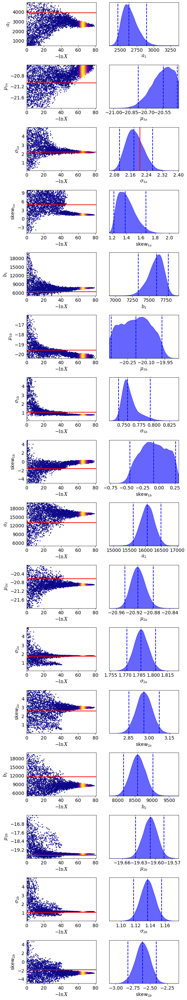

In [77]:
n_params = len(labels2_bi)

fig, axes = dyplot.traceplot(dres2_V2_rabsmag, 
                             labels=labels2_bi, 
                             truths=V2_rabsmag_bestfit2.x, 
                             fig=plt.subplots(n_params, 2, figsize=(8, 2.6*n_params)), 
                             thin=10)

fig.tight_layout();

In [78]:
lnzM2_V2_rabsmag = dres2_V2_rabsmag.logz[-1]
lnzM2_V2_rabsmag

-1102.2703207303816

In [79]:
V2_rabsmag_bestfit2_dynesty,_ = dyfunc.mean_and_cov(dres2_V2_rabsmag.samples, 
                                                    np.exp(dres2_V2_rabsmag.logwt - lnzM2_V2_rabsmag))

V2_rabsmag_bestfit2_dynesty

array([ 2.64464232e+03, -2.05537547e+01,  2.18054686e+00,  1.39951118e+00,
        7.59320025e+03, -2.01823309e+01,  7.59532826e-01, -8.08749348e-02,
        1.60567925e+04, -2.09108288e+01,  1.78713148e+00,  2.96367946e+00,
        8.58915958e+03, -1.96098541e+01,  1.13650504e+00, -2.60943651e+00])

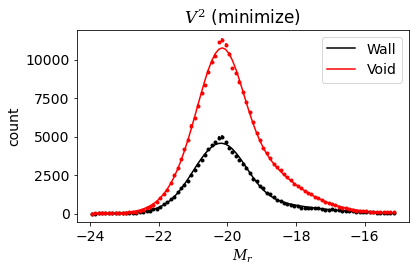

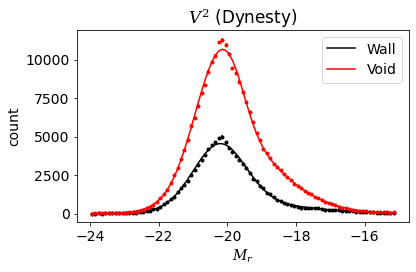

In [80]:
Model_2_plot(V2_rabsmag_bestfit2.x, 
             rabsmag_NSA[wall_v2], 
             rabsmag_NSA[void_v2], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text='$V^2$ (minimize)')

Model_2_plot(V2_rabsmag_bestfit2_dynesty, 
             rabsmag_NSA[wall_v2], 
             rabsmag_NSA[void_v2], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text='$V^2$ (Dynesty)')

##### VoidFinder

In [30]:
temp_infile = open('pocoMC_results/sampler_results_M2_rabsmag_VoidFinder.pickle', 
                   'rb')
VF_results2 = pickle.load(temp_infile)
temp_infile.close()

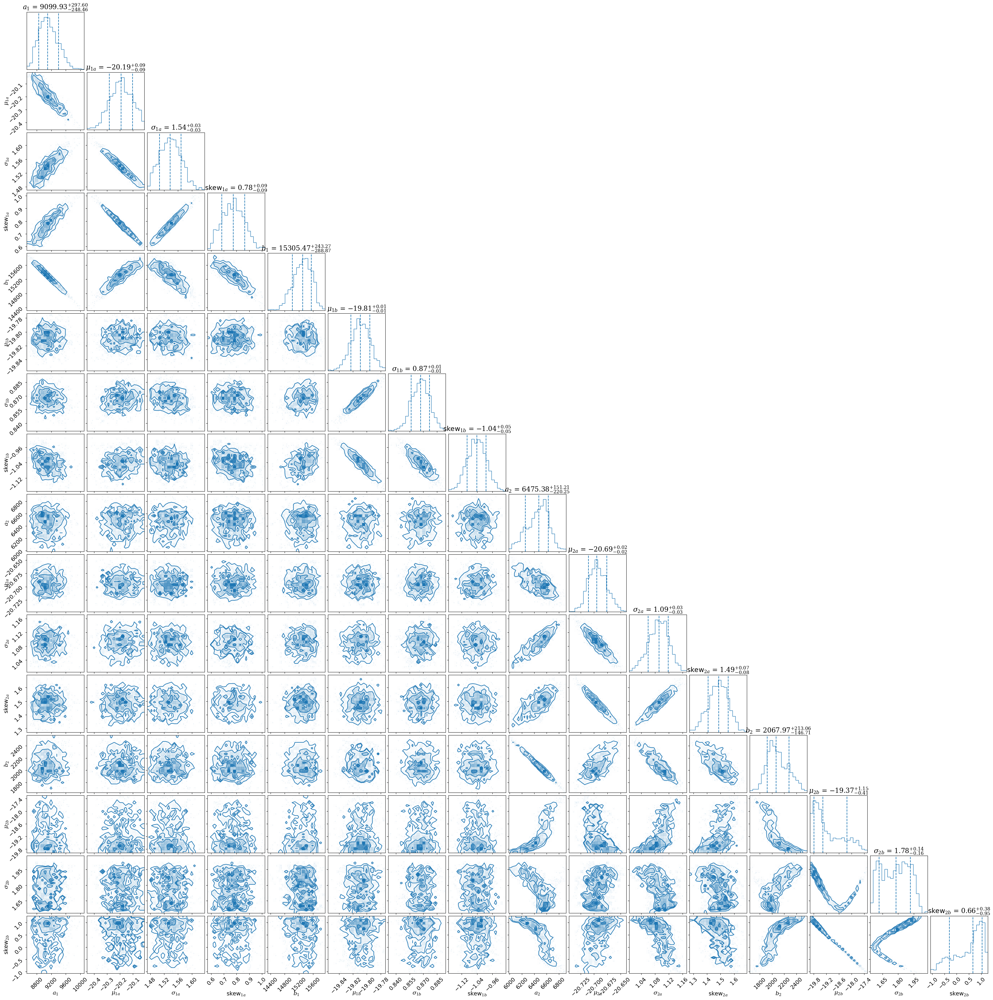

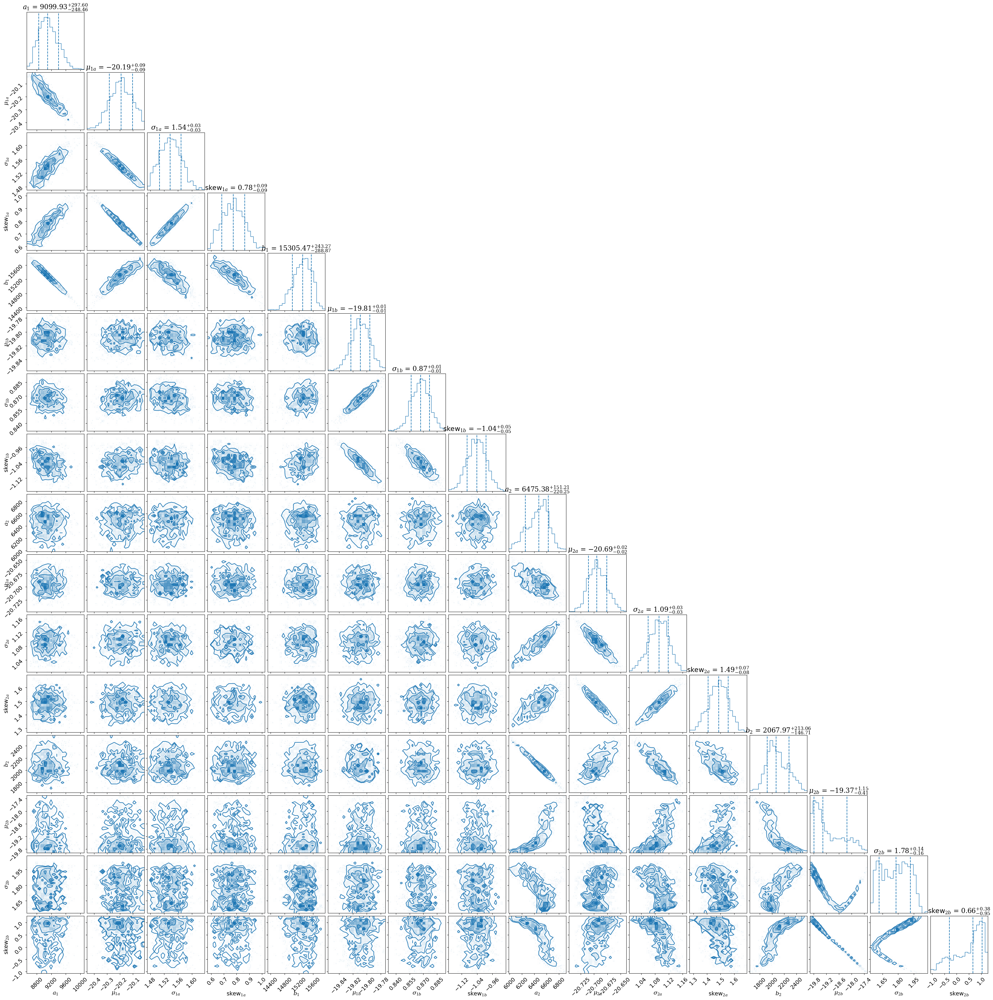

In [31]:
pc.plotting.corner(VF_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [32]:
lnzM2_VF = VF_results2['logz'][-1]
lnzM2_VF

-1144.4396021477944

In [33]:
VF_bestfit2 = np.mean(VF_results2['samples'], axis=0)

VF_bestfit2

array([ 9.1182012e+03, -2.0192127e+01,  1.5382347e+00,  7.7503002e-01,
        1.5285793e+04, -1.9809214e+01,  8.6686379e-01, -1.0421410e+00,
        6.4561812e+03, -2.0693336e+01,  1.0900003e+00,  1.4823964e+00,
        2.0898152e+03, -1.9109688e+01,  1.7732158e+00,  4.5963880e-01],
      dtype=float32)

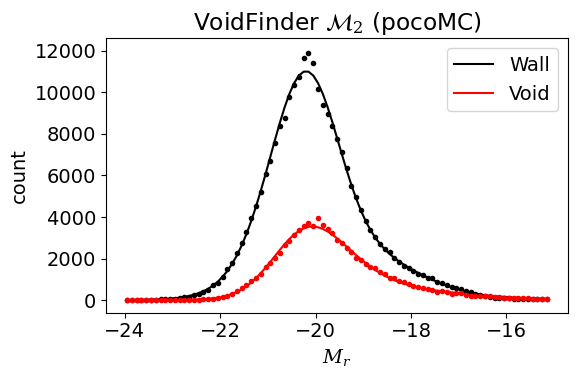

In [34]:
Model_2_plot(VF_bestfit2, 
             rabsmag_NSA[wall_vf], 
             rabsmag_NSA[void_vf], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'VoidFinder $\mathcal{M}_2$ (pocoMC)')

## Bayes Factor

In [94]:
lnB12_V2_rabsmag = lnzM1_V2_rabsmag - lnzM2_V2_rabsmag

B12_V2_rabsmag = np.exp(lnB12_V2_rabsmag)

#print('V2 Mr: B12 = {:.3g}; log(B12) = {:.3g}'.format(B12_V2_rabsmag, np.log10(B12_V2_rabsmag)))
print('V2 Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_rabsmag, lnB12_V2_rabsmag*np.log10(np.exp(1))))

V2 Mr: B12 = 3.78e-309; log(B12) = -308.422


In [36]:
lnB12_VF = lnzM1_VF - lnzM2_VF

B12_VF = np.exp(lnB12_VF)

print('VoidFinder Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_VF, lnB12_VF*np.log10(np.exp(1))))

VoidFinder Mr: B12 = 0; log(B12) = -1248.044


So both $V^2$ and VoidFinder overwhelmingly favor model $\mathcal{M}_2$, in which the two data sets come from different parent distributions.